<a href="https://colab.research.google.com/github/PrabishaPradeep/Dsa/blob/main/prabisha_unsupervised_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CASE STUDY ON UNSUPERVISED LEARNING

### Import required libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
import warnings
warnings.filterwarnings("ignore")

### Load the dataset

In [2]:
wine=pd.read_csv('/content/Wine_clust .csv')
wine

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


### Check for null values

In [3]:
wine.isnull().sum()

,0
Alcohol,0
Malic_Acid,0
Ash,0
Ash_Alcanity,0
Magnesium,0
Total_Phenols,0
Flavanoids,0
Nonflavanoid_Phenols,0
Proanthocyanins,0
Color_Intensity,0


There are no null values present in the dataset.

### Check for duplicates

In [4]:
wine.duplicated().sum()

0

There are no duplicates present in the dataset.

### Standard scaling

Clustering algorithms typically require feature scaling to ensure equal distance consideration across all features.
Without scaling, features with larger scales dominate the distance calculations, leading to biased clusters.

In [5]:
sc=StandardScaler()
wine_sc=sc.fit_transform(wine)
wine_sc=pd.DataFrame(wine_sc,columns=wine.columns)
wine_sc.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
0,1.518613,-0.562250,0.232053,-1.169593,1.913905,0.808997,1.034819,-0.659563,1.224884,0.251717,0.362177,1.847920,1.013009
1,0.246290,-0.499413,-0.827996,-2.490847,0.018145,0.568648,0.733629,-0.820719,-0.544721,-0.293321,0.406051,1.113449,0.965242
2,0.196879,0.021231,1.109334,-0.268738,0.088358,0.808997,1.215533,-0.498407,2.135968,0.269020,0.318304,0.788587,1.395148
3,1.691550,-0.346811,0.487926,-0.809251,0.930918,2.491446,1.466525,-0.981875,1.032155,1.186068,-0.427544,1.184071,2.334574
4,0.295700,0.227694,1.840403,0.451946,1.281985,0.808997,0.663351,0.226796,0.401404,-0.319276,0.362177,0.449601,-0.037874


# Clustering with original number of features

## K means clustering

### Find optimum number of clusters - Elbow method

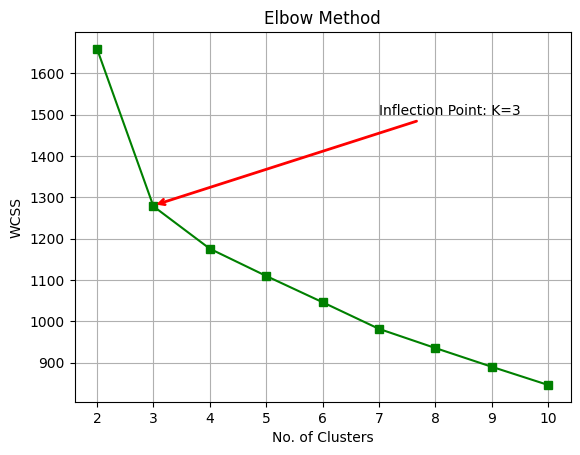

In [6]:
wcss=[]
for i in range(2,11):
    kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
    kmeans.fit(wine_sc)
    wcss.append(kmeans.inertia_)
plt.plot(range(2,11),wcss,'gs-')
plt.annotate('Inflection Point: K=3',
             xy=(3,1280),
             xytext=(7,1500),
             arrowprops = dict(arrowstyle='->', connectionstyle='arc3', color='red', lw=2))
plt.grid(True)
plt.title('Elbow Method')
plt.xlabel('No. of Clusters')
plt.ylabel('WCSS')
plt.show()

Optimum no. of clusters = 3

### Create model with optimum number of clusters

In [7]:
kmeans=KMeans(n_clusters=3,init='k-means++')
kmeans.fit(wine_sc)
wine_sc['cluster'] = kmeans.labels_

### Plot clusters

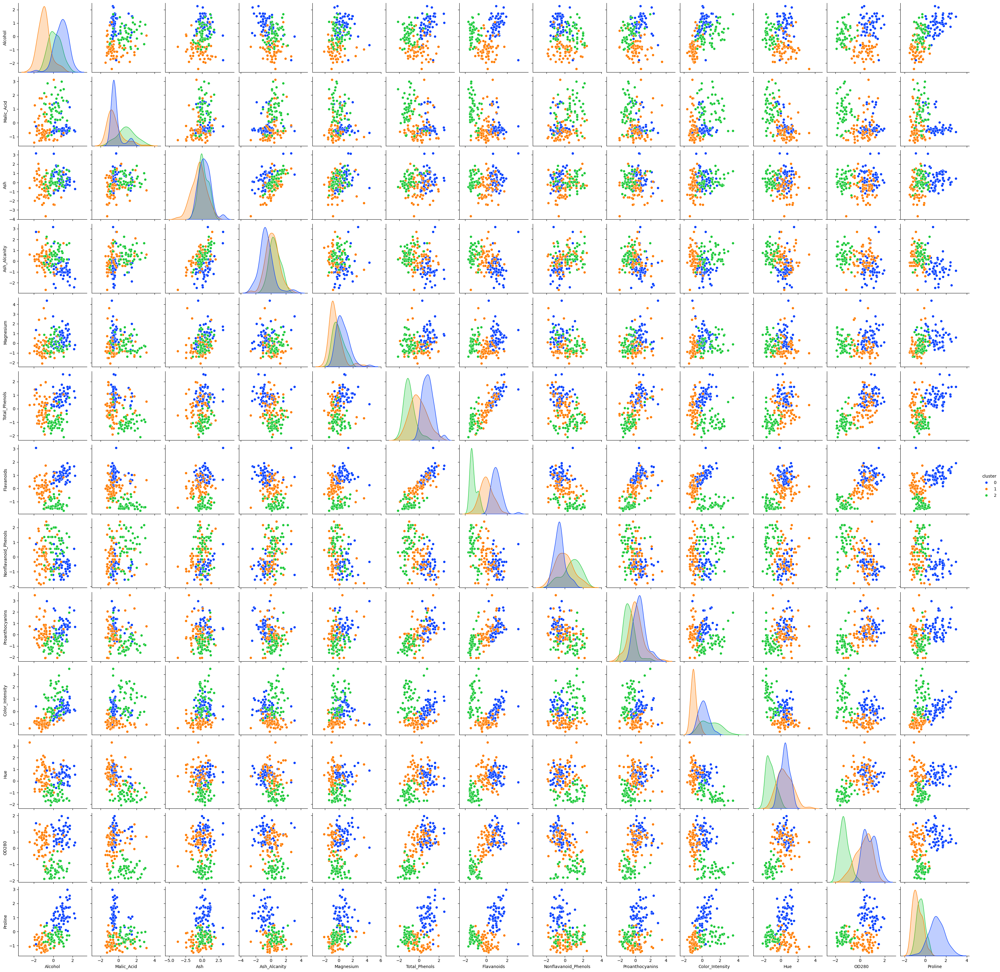

In [8]:
sns.pairplot(wine_sc, hue='cluster', palette='bright')
plt.show()

In [9]:
wine_sc.drop('cluster',axis=1,inplace=True)

### Evaluation metric - Silhouette score

In [10]:
silhouette_score_k=round(silhouette_score(wine_sc,kmeans.labels_),3)
silhouette_score_k

0.285

Silhouette score is less than 0.5 which means clustering is average. Clusters are overlapped.

## Agglomerative clustering

### Find optimum number of clusters - Dendrogram method

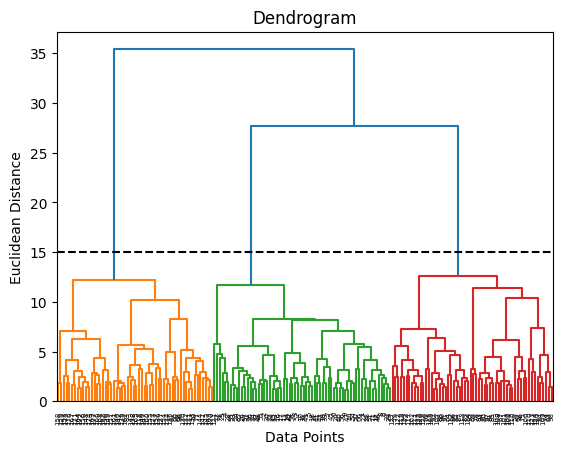

In [11]:
dend=sch.dendrogram(sch.linkage(wine_sc,method='ward'))
plt.axhline(y=15, color='black', linestyle='--')
plt.title('Dendrogram')
plt.xlabel('Data Points')
plt.ylabel('Euclidean Distance')
plt.show()

Optimum no. of clusters = 3

### Create model with optimum number of clusters

In [12]:
hc=AgglomerativeClustering(n_clusters=3,metric='euclidean',linkage='ward')
hc.fit(wine_sc)
wine_sc['cluster'] = hc.labels_

### Plot clusters

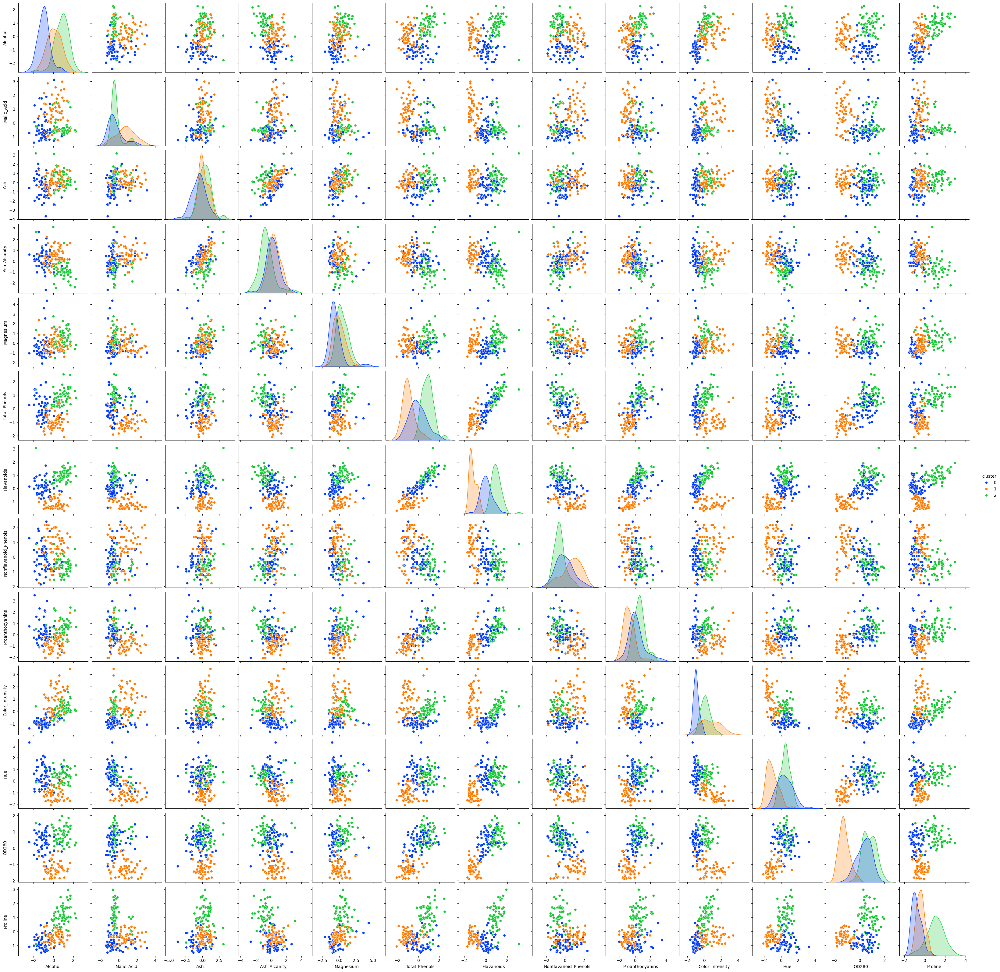

In [13]:
sns.pairplot(wine_sc, hue='cluster', palette='bright')
plt.show()

In [14]:
wine_sc.drop('cluster',axis=1,inplace=True)

### Evaluation metric - Silhouette score

In [15]:
silhouette_score_hc=round(silhouette_score(wine_sc,hc.labels_),3)
silhouette_score_hc

0.277

Silhouette score is less than 0.5 which means clustering is average. Clusters are overlapped.

## DBSCAN clustering

DBSCAN: Density Based Spatial Clustering of Applications with Noise

In [16]:
db=DBSCAN(eps=2.35, min_samples=5).fit(wine_sc)
y_db=db.fit_predict(wine_sc)
wine_sc['cluster']=db.labels_

### Plot clusters

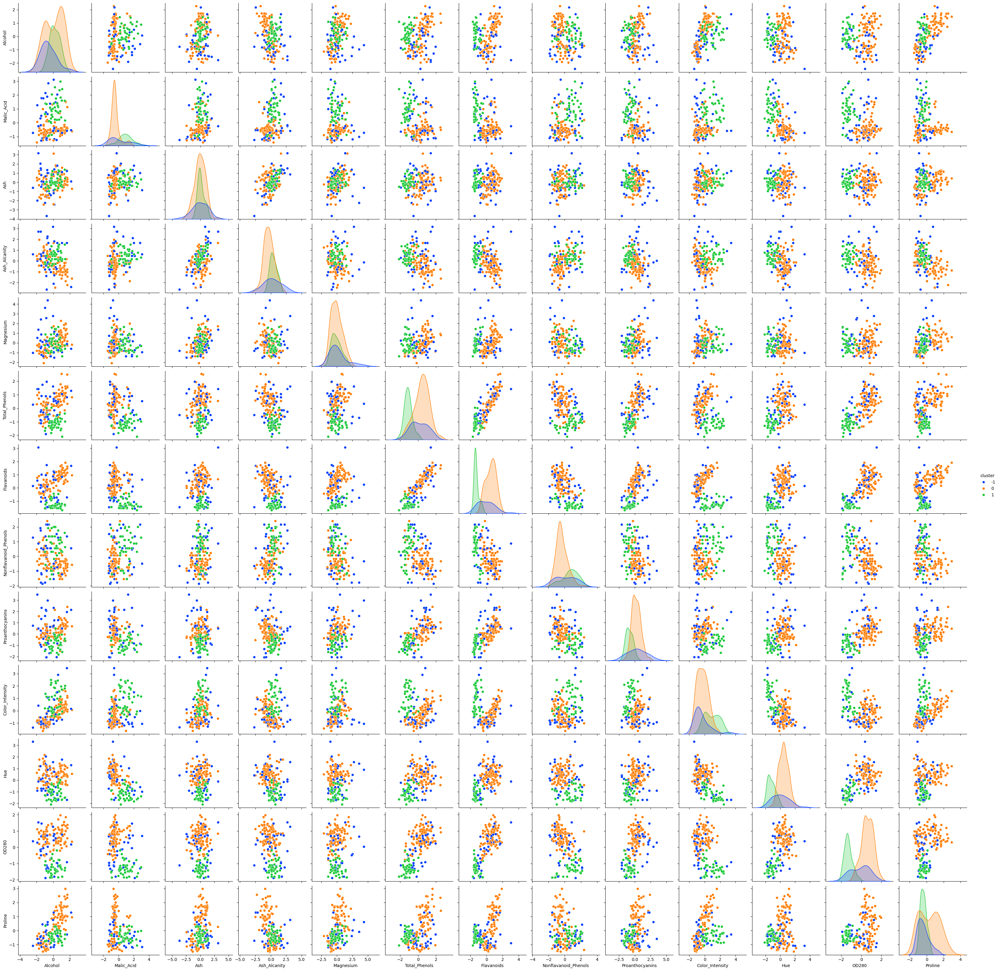

In [17]:
sns.pairplot(wine_sc, hue='cluster', palette='bright')
plt.show()

Here three clusters are formed. Blue represents the noisy points in the data (-1 cluster).

In [18]:
wine_sc.drop('cluster',axis=1,inplace=True)

### Evaluation metric - Silhouette score

In [19]:
silhouette_score_db=round(silhouette_score(wine_sc,y_db),3)
silhouette_score_db

0.188

Silhouette score is less than 0.5 which means clustering is average. Clusters are overlapped.

# Clustering with PCA

PCA - Principal Component Analysis

### Determine the number of principal components

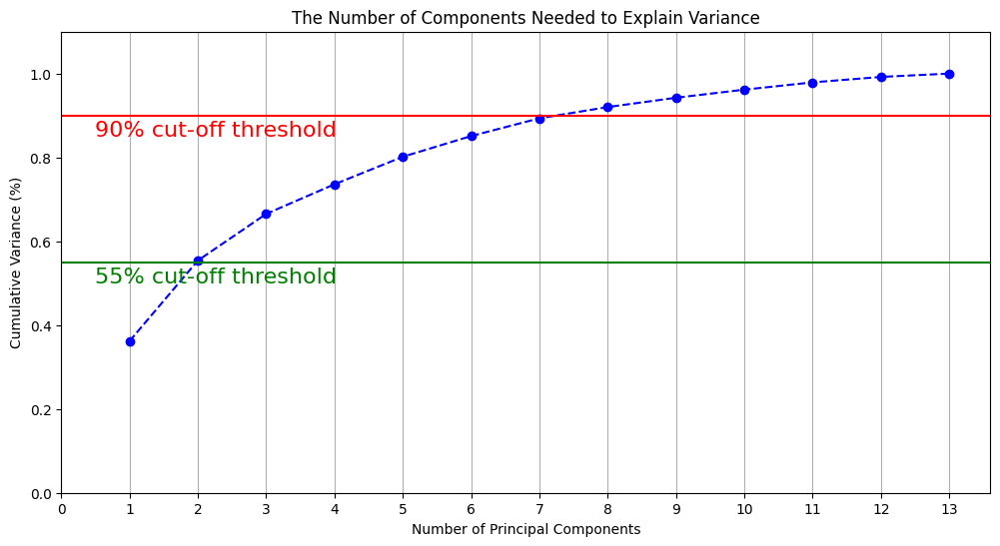

In [20]:
pca=PCA().fit(wine_sc)
plt.rcParams["figure.figsize"] = (12,6)
fig, ax = plt.subplots()
xi = np.arange(1, 14, step=1)
y = np.cumsum(pca.explained_variance_ratio_)
plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')
plt.xlabel('Number of Principal Components')
plt.xticks(np.arange(0, 14, step=1))
plt.ylabel('Cumulative Variance (%)')
plt.title('The Number of Components Needed to Explain Variance')
plt.axhline(y=0.90, color='r', linestyle='-')
plt.text(0.5, 0.85, '90% cut-off threshold', color = 'red', fontsize=16)
plt.axhline(y=0.55, color='g', linestyle='-')
plt.text(0.5, 0.5, '55% cut-off threshold', color = 'green', fontsize=16)
ax.grid(axis='x')
plt.show()

90% of cumulative variance is explained by 7 components. Also 55% of cumulative variance is explained by 2 components only.

# PCA with 7 components

Minimize the dataset from 13 features to 7 features using PCA

In [21]:
pca=PCA(n_components=7).fit(wine_sc)
x_pca=pca.transform(wine_sc)
wine_pca=pd.DataFrame(x_pca,columns=['PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7'])
wine_pca.head()

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7
0,3.316751,-1.443463,-0.165739,-0.215631,0.693043,-0.223880,0.596427
1,2.209465,0.333393,-2.026457,-0.291358,-0.257655,-0.927120,0.053776
2,2.516740,-1.031151,0.982819,0.724902,-0.251033,0.549276,0.424205
3,3.757066,-2.756372,-0.176192,0.567983,-0.311842,0.114431,-0.383337
4,1.008908,-0.869831,2.026688,-0.409766,0.298458,-0.406520,0.444074


## K means clustering

### Find optimum number of clusters - Elbow method

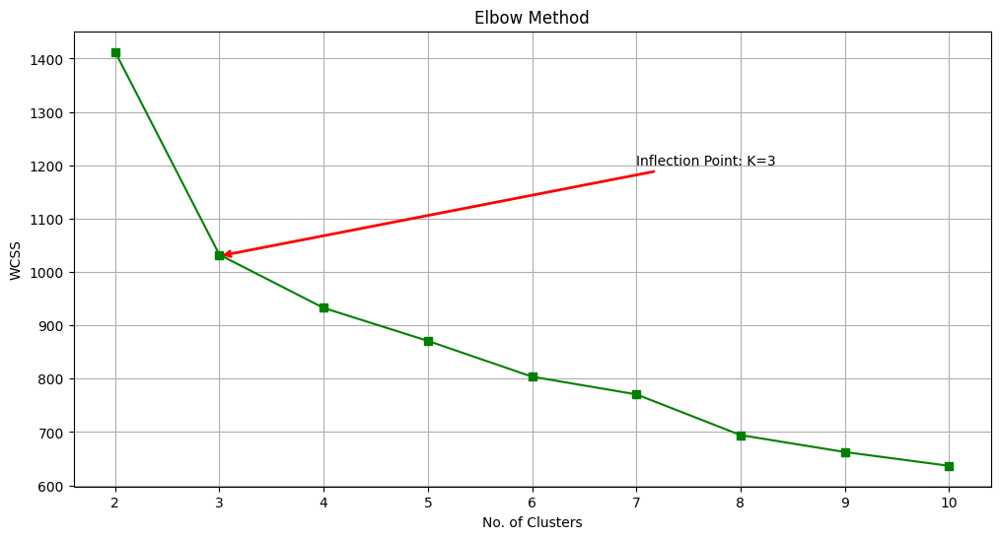

In [22]:
wcss=[]
for i in range(2,11):
    kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
    kmeans.fit(wine_pca)
    wcss.append(kmeans.inertia_)
plt.plot(range(2,11),wcss,'gs-')
plt.annotate('Inflection Point: K=3',
             xy=(3,1030),
             xytext=(7,1200),
             arrowprops = dict(arrowstyle='->', connectionstyle='arc3', color='red', lw=2))
plt.grid(True)
plt.title('Elbow Method')
plt.xlabel('No. of Clusters')
plt.ylabel('WCSS')
plt.show()

Optimum no. of clusters = 3

### Create model with optimum number of clusters

In [23]:
kmeans=KMeans(n_clusters=3,init='k-means++')
kmeans.fit(wine_pca)
wine_pca['cluster'] = kmeans.labels_

### Plot clusters

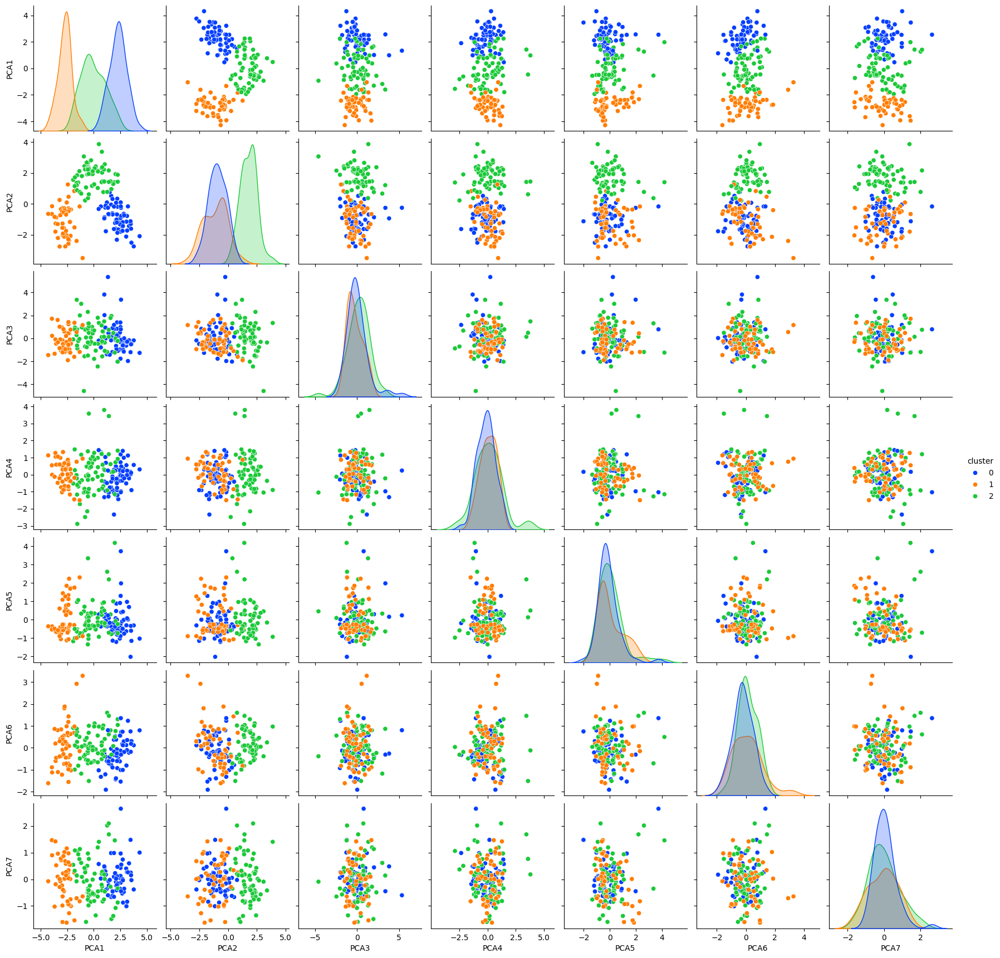

In [24]:
sns.pairplot(wine_pca, hue='cluster', palette='bright')
plt.show()

In [25]:
wine_pca.drop('cluster',axis=1,inplace=True)

### Evaluation metric - Silhouette score

In [26]:
silhouette_score_k1=round(silhouette_score(wine_pca,kmeans.labels_),3)
silhouette_score_k1

0.328

Silhouette score is less than 0.5 which means clustering is average. Clusters are overlapped.

## Agglomerative clustering

### Find optimum number of clusters - Dendrogram method

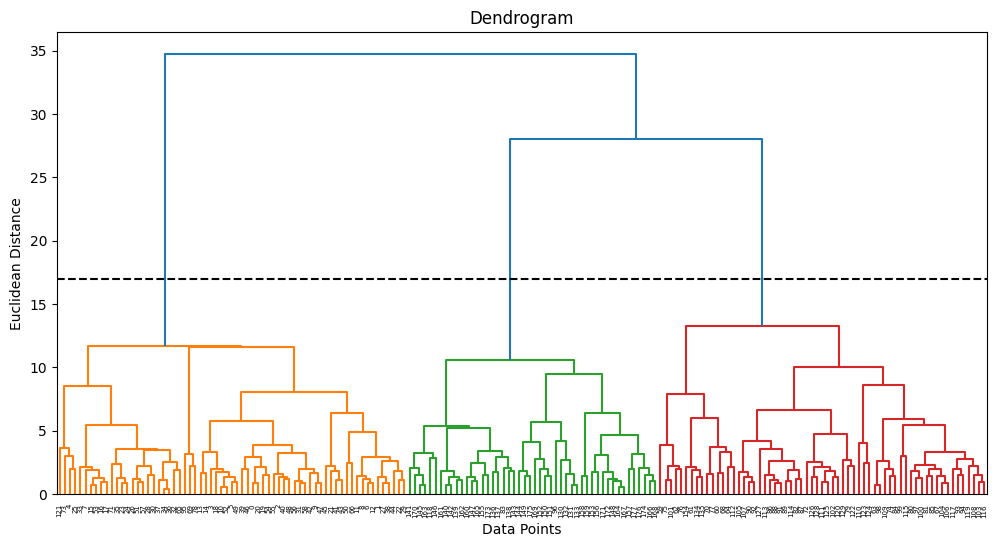

In [27]:
dend=sch.dendrogram(sch.linkage(wine_pca,method='ward'))
plt.axhline(y=17, color='black', linestyle='--')
plt.title('Dendrogram')
plt.xlabel('Data Points')
plt.ylabel('Euclidean Distance')
plt.show()

Optimum no. of clusters = 3

### Create model with optimum number of clusters

In [28]:
hc=AgglomerativeClustering(n_clusters=3,metric='euclidean',linkage='ward')
hc.fit(wine_pca)
wine_pca['cluster'] = hc.labels_

### Plot clusters

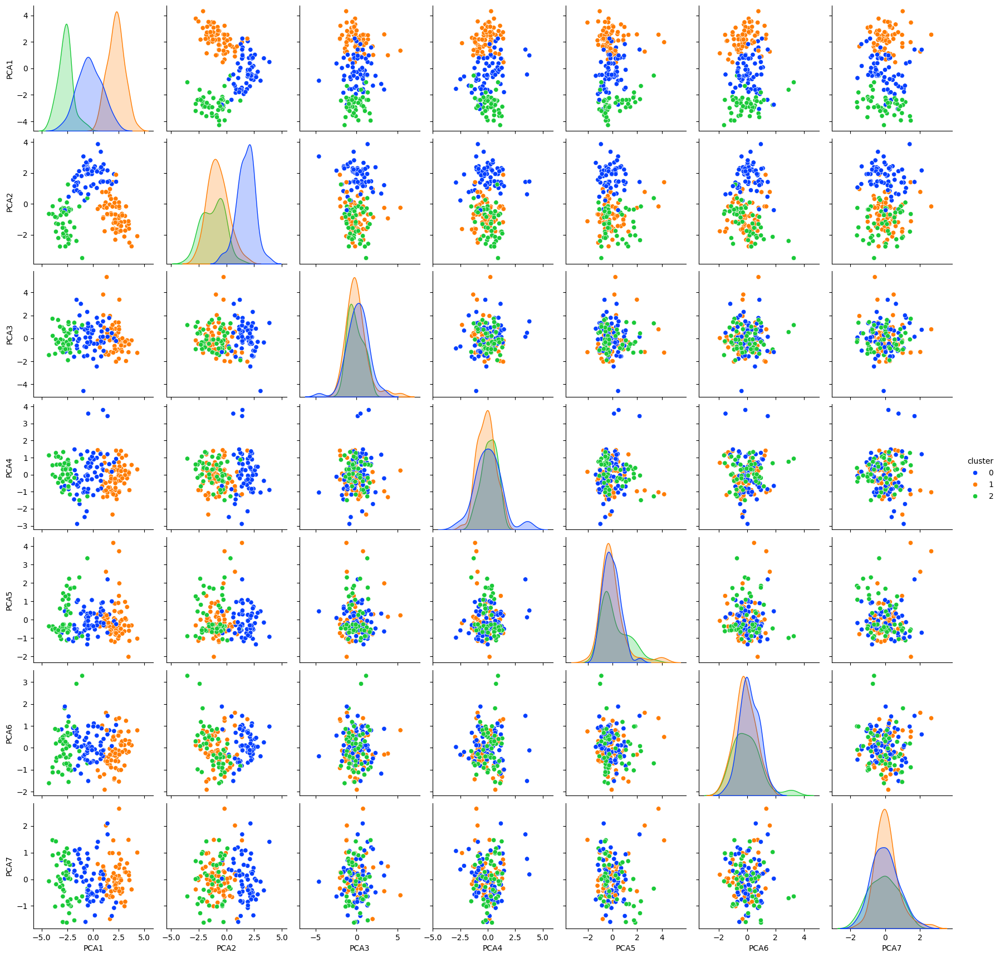

In [29]:
sns.pairplot(wine_pca, hue='cluster', palette='bright')
plt.show()

In [30]:
wine_pca.drop('cluster',axis=1,inplace=True)

### Evaluation metric - Silhouette score

In [31]:
silhouette_score_hc1=round(silhouette_score(wine_pca,hc.labels_),3)
silhouette_score_hc1

0.309

Silhouette score is less than 0.5 which means clustering is average. Clusters are overlapped.

## DBSCAN clustering

In [32]:
db=DBSCAN(eps=1.95, min_samples=5).fit(wine_pca)
y_db=db.fit_predict(wine_pca)
wine_pca['cluster']=db.labels_

### Plot clusters

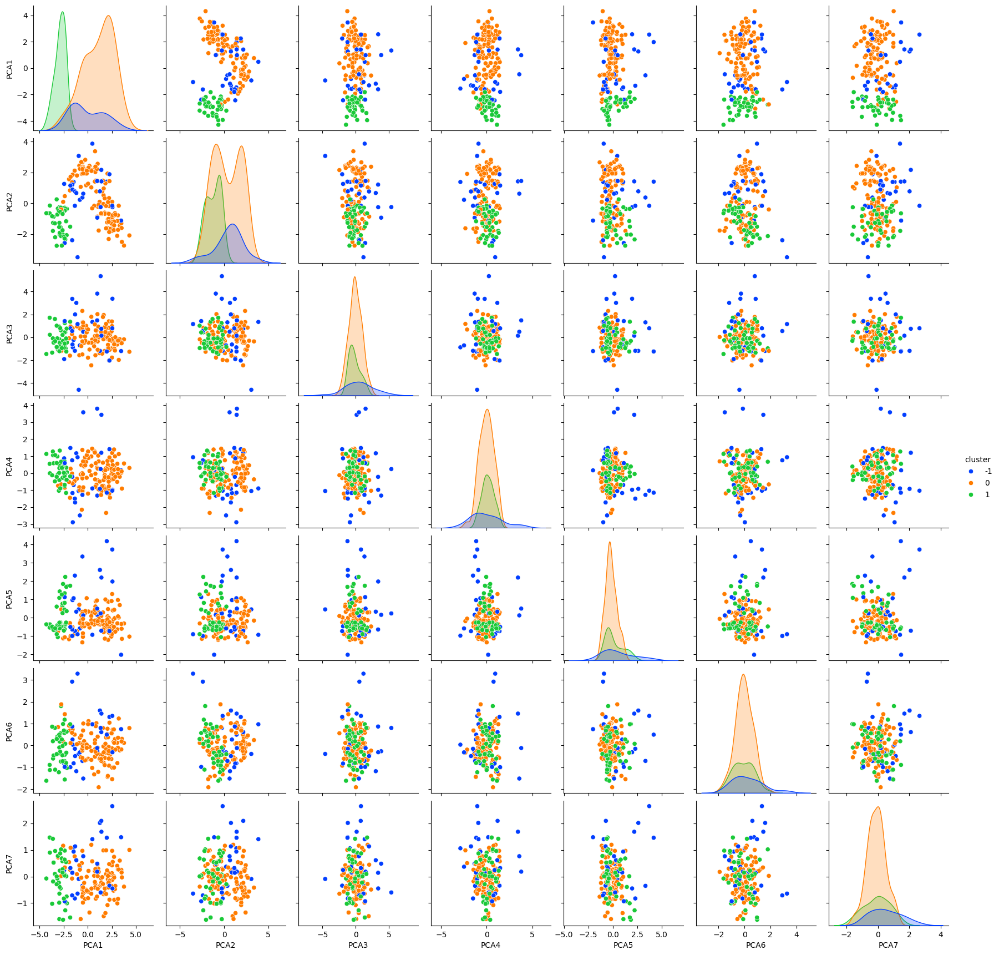

In [33]:
sns.pairplot(wine_pca, hue='cluster', palette='bright')
plt.show()

Here three clusters are formed. Blue represents the noisy points in the data (-1 cluster).

In [34]:
wine_pca.drop('cluster',axis=1,inplace=True)

### Evaluation metric - Silhouette score

In [35]:
silhouette_score_db1=round(silhouette_score(wine_pca,y_db),3)
silhouette_score_db1

0.234

Silhouette score is less than 0.5 which means clustering is average. There is some overlapping between clusters.

# PCA with 2 components

Minimize the dataset from 13 features to 2 features using PCA

In [36]:
pca=PCA(n_components=2).fit(wine_sc)
x_pca=pca.transform(wine_sc)
x_pca=pd.DataFrame(x_pca,columns=['PCA1','PCA2'])
x_pca.head()

,PCA1,PCA2
0,3.316751,-1.443463
1,2.209465,0.333393
2,2.516740,-1.031151
3,3.757066,-2.756372
4,1.008908,-0.869831


## K means clustering

### Find optimum number of clusters - Elbow method

In [37]:
x=x_pca.values

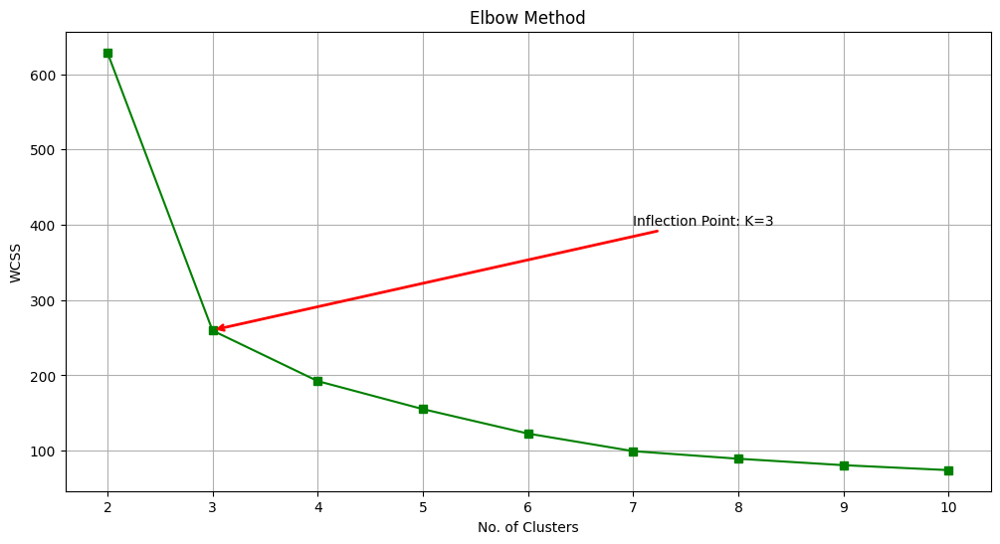

In [38]:
wcss=[]
for i in range(2,11):
    kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
    kmeans.fit(x)
    wcss.append(kmeans.inertia_)
plt.plot(range(2,11),wcss,'gs-')
plt.annotate('Inflection Point: K=3',
             xy=(3,260),
             xytext=(7,400),
             arrowprops = dict(arrowstyle='->', connectionstyle='arc3', color='red', lw=2))
plt.grid(True)
plt.title('Elbow Method')
plt.xlabel('No. of Clusters')
plt.ylabel('WCSS')
plt.show()

Optimum no. of clusters = 3

### Create model with optimum number of clusters

In [39]:
kmeans=KMeans(n_clusters=3,init='k-means++')
y_kmeans=kmeans.fit_predict(x)

### Plot clusters

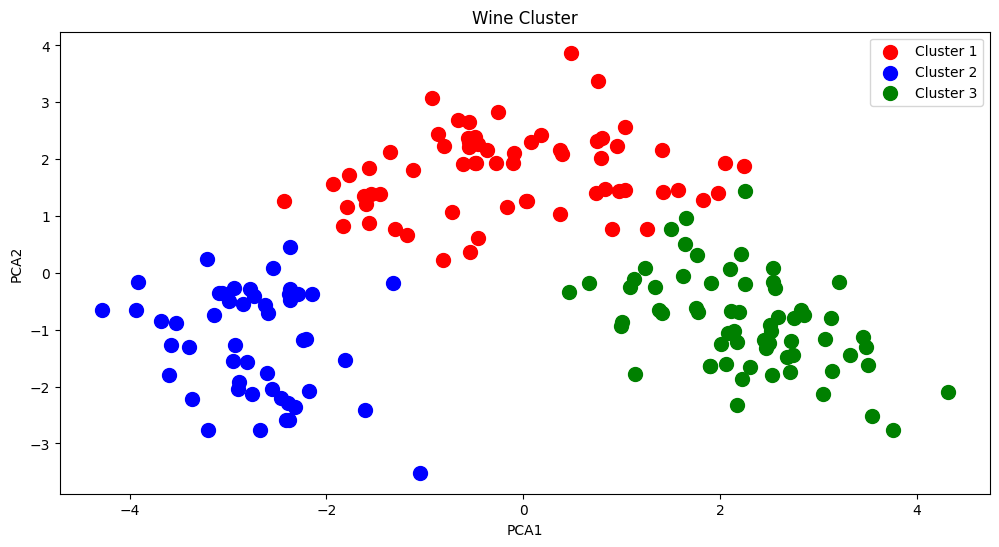

In [40]:
plt.scatter(x[y_kmeans==0,0],x[y_kmeans==0,1],s=100,c='red',label='Cluster 1')
plt.scatter(x[y_kmeans==1,0],x[y_kmeans==1,1],s=100,c='blue',label='Cluster 2')
plt.scatter(x[y_kmeans==2,0],x[y_kmeans==2,1],s=100,c='green',label='Cluster 3')
plt.title('Wine Cluster')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend()
plt.show()

### Evaluation metric - Silhouette score

In [41]:
silhouette_score_k2=round(silhouette_score(x,y_kmeans),3)
silhouette_score_k2

0.561

Silhouette score is greater than 0.5 which means clustering is good, overlapping between clusters is less.

## Agglomerative clustering

### Find optimum number of clusters - Dendrogram method

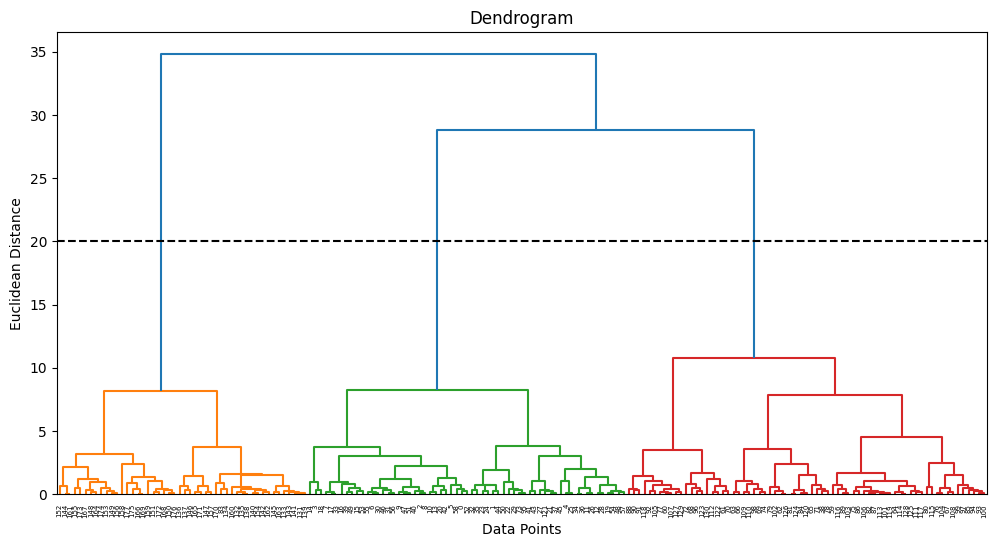

In [42]:
dend=sch.dendrogram(sch.linkage(x,method='ward'))
plt.axhline(y=20, color='black', linestyle='--')
plt.title('Dendrogram')
plt.xlabel('Data Points')
plt.ylabel('Euclidean Distance')
plt.show()

Optimum no. of clusters = 3

### Create model with optimum number of clusters

In [43]:
hc=AgglomerativeClustering(n_clusters=3,metric='euclidean',linkage='ward')
y_hc=hc.fit_predict(x)

### Plot clusters

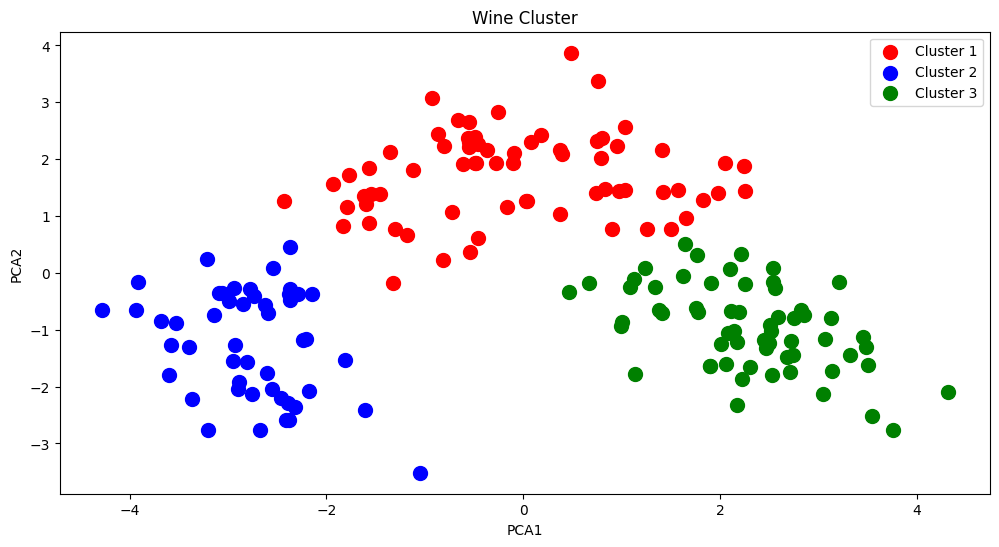

In [44]:
plt.scatter(x[y_hc==0,0],x[y_hc==0,1],s=100,c='red',label='Cluster 1')
plt.scatter(x[y_hc==1,0],x[y_hc==1,1],s=100,c='blue',label='Cluster 2')
plt.scatter(x[y_hc==2,0],x[y_hc==2,1],s=100,c='green',label='Cluster 3')
plt.title('Wine Cluster')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend()
plt.show()

### Evaluation metric - Silhouette score

In [45]:
silhouette_score_hc2=round(silhouette_score(x,y_hc),3)
silhouette_score_hc2

0.559

Silhouette score is greater than 0.5 which means clustering is good, overlapping between clusters is less.

## DBSCAN clustering

In [46]:
db = DBSCAN(eps=0.55, min_samples=5).fit(x)
y_db=db.fit_predict(x)
cluster=db.labels_

### Plot clusters

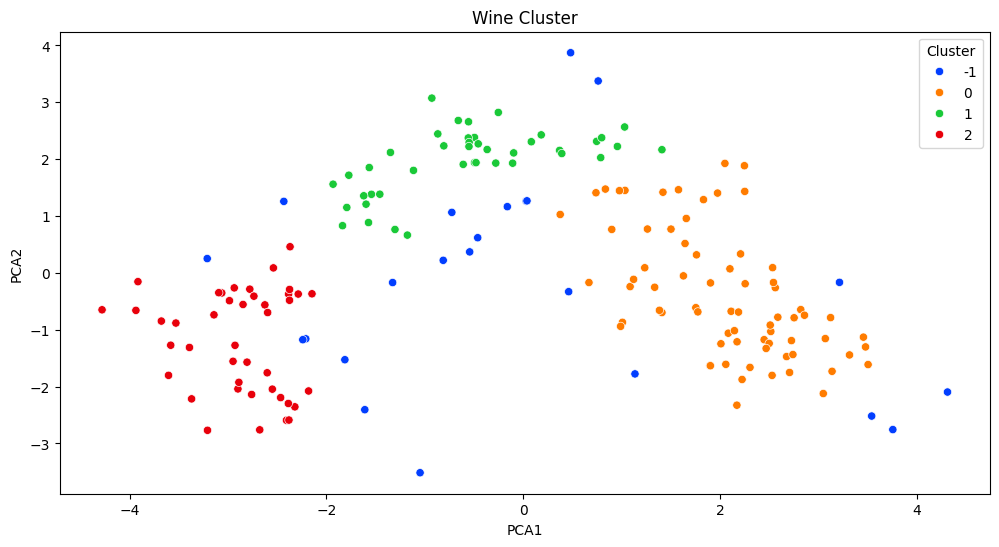

In [47]:
sns.scatterplot(data = x_pca, x = 'PCA1', y = 'PCA2', hue = cluster, palette='bright')
plt.title('Wine Cluster')
plt.legend(title='Cluster')
plt.show()

Here four clusters are formed. Blue represents the noisy points in the data (-1 cluster).

### Evaluation metric - Silhouette score

In [48]:
silhouette_score_db2=round(silhouette_score(x,y_db),3)
silhouette_score_db2

0.408

Silhouette score is less than 0.5 which means clustering is average. There is some overlapping between clusters.

# Comparison between clustering models

In [49]:
mux = pd.MultiIndex.from_product([['No. of Features used for Clustering'],['Full (13)','7','2']])
Metric=['Kmeans','Agglomerative','DBSCAN']
comp_table = pd.DataFrame([[silhouette_score_k,silhouette_score_k1,silhouette_score_k2],[silhouette_score_hc,silhouette_score_hc1,silhouette_score_hc2],[silhouette_score_db,silhouette_score_db1,silhouette_score_db2]] , columns=mux)
comp_table.index=Metric
comp_table = comp_table.style.set_table_styles([dict(selector='th', props=[('text-align', 'center')])])
comp_table

OBSERVATIONS:

1. K means clustering perform better for all the 3 cases - clustering with original number of features, clustering with 7 features by PCA and clustering with 2 features by PCA.
2. When we reduce number of features by PCA, our clustering got improved in all the 3 clustering techniques.